<a href="https://colab.research.google.com/github/LizcanoJuan1010/Machine-Learning-Projects/blob/main/deeplearning_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Contexto del problema

En este experimento, implementaremos tres algoritmos diferentes para la clasificación de vinos. Para ello, hemos modificado la variable objetivo, reemplazando "quality" por "export_quality", de modo que solo los vinos de mejor calidad sean clasificados como aptos para la exportación.

El conjunto de datos utilizado proviene de las variantes rojas del vino portugués *Vinho Verde*. Este dataset describe la concentración de varios componentes químicos presentes en el vino y su impacto en la calidad. El objetivo es predecir si un vino es apto para la exportación en función de las características fisicoquímicas proporcionadas.

Aunque el proyecto tiene una formulación relativamente sencilla, presenta varios desafíos, especialmente debido al desequilibrio en las clases y la limitada cantidad de muestras. Estos obstáculos deberán ser abordados para construir un modelo predictivo robusto y efectivo.

#### Variables de entrada (derivadas de pruebas fisicoquímicas):

- Acidez fija  
- Acidez volátil  
- Ácido cítrico  
- Azúcar residual  
- Cloruros  
- Dióxido de azufre libre  
- Dióxido de azufre total  
- Densidad  
- pH  
- Sulfatos  
- Alcohol  

#### Variable de salida:

- **Export_quality**: Variable binaria que indica si el vino es de calidad apta para la exportación o de calidad destinada al mercado doméstico. Inicialmente, la variable de calidad se encuentra en una escala del 0 al 10, pero se transforma en binaria para este experimento, considerando que los vinos con calificación superior a un umbral específico serán clasificados como aptos para la exportación.


## Comprencion de los datos que tenemos
Como se dijo anteriormente nuestro objetivo es predecir si un vino sera de calidad exportacion.

Para esto  es necesario comprender los datos que tenemos

In [ ]:
import kagglehub
import os
import pandas as pd
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px


In [ ]:

path = kagglehub.dataset_download("yasserh/wine-quality-dataset")
print("Path to dataset files:", path)
print(os.listdir(path))
df = pd.read_csv(path + '/WineQT.csv')



Path to dataset files: /root/.cache/kagglehub/datasets/yasserh/wine-quality-dataset/versions/1
['WineQT.csv']


In [ ]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


Con base en los datos disponibles, decidimos establecer de manera arbitraria que un vino se considerará de calidad de exportación si su calificación se encuentra por encima del cuantil 0.75.

In [ ]:
threshold = df['quality'].quantile(0.75)

print(f"Valor mínimo para calidad de exportación basado en el percentil 75: {threshold}")

Valor mínimo para calidad de exportación basado en el percentil 75: 6.0


In [ ]:
df['export_quality'] = np.where(df['quality'] > 5, 'export', 'domestic')


In [ ]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id,export_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0,domestic
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1,domestic
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2,domestic
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3,export
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4,domestic


Con lo anterior, el dataframe con el que se desarrollara el experimento sera este:

In [ ]:

df = df.drop('quality', axis=1)
df = df.drop('Id', axis=1)

df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,export_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,domestic
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,domestic
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,domestic
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,export
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,domestic


# Análisis exploratorio de datos (EDA)

In [ ]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000


In [ ]:
df.sample(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,export_quality
36,6.6,0.50,0.04,2.1,0.068,6.0,14.0,0.99550,3.39,0.64,9.4,export
706,9.1,0.30,0.34,2.0,0.064,12.0,25.0,0.99516,3.26,0.84,11.7,export
862,10.9,0.32,0.52,1.8,0.132,17.0,44.0,0.99734,3.28,0.77,11.5,export
746,11.6,0.23,0.57,1.8,0.074,3.0,8.0,0.99810,3.14,0.70,9.9,export
1079,6.4,0.36,0.21,2.2,0.047,26.0,48.0,0.99661,3.47,0.77,9.7,export


<ipython-input-76-c59efc3ac293>:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Axes: xlabel='count', ylabel='export_quality'>

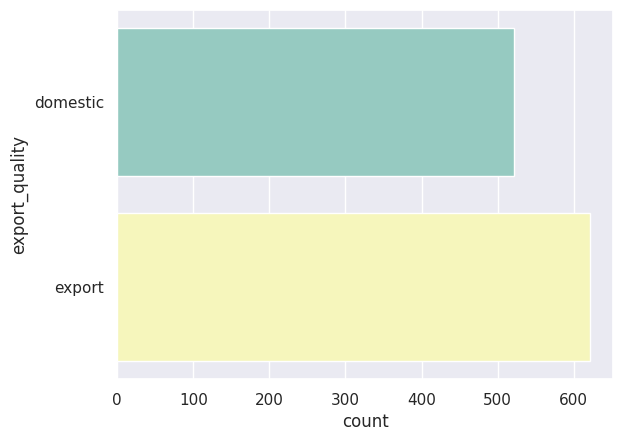

In [ ]:

sns.countplot(df['export_quality'], palette='Set3')

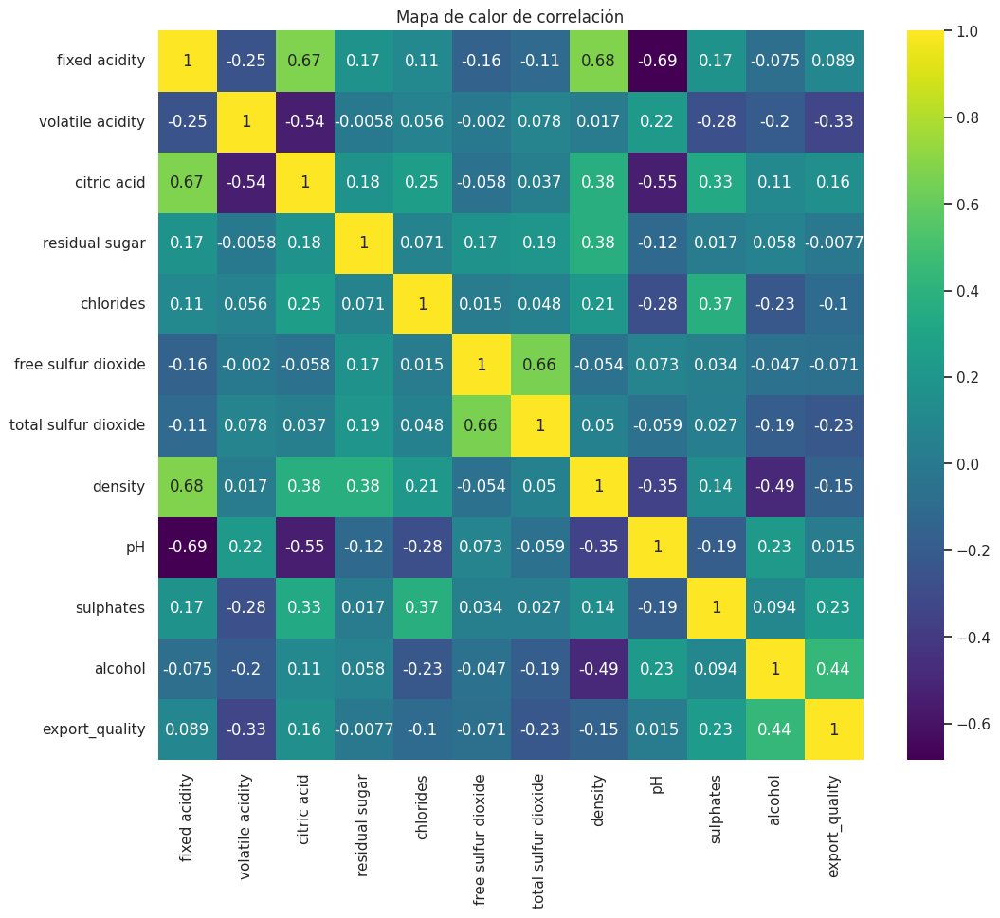

In [ ]:
df_encoded = df.copy()
df_encoded['export_quality'] = df_encoded['export_quality'].map({'domestic': 0, 'export': 1})

# Crear el heatmap de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(df_encoded.corr(), annot=True, cmap='viridis')
plt.title("Mapa de calor de correlación")
plt.show()


In [ ]:
for column in df.columns[:-2]:
   fig= px.density_heatmap(df, x=column, y="export_quality")
   fig.show()

## Variable Dependiente (export_quality)

La variable **export_quality** es nuestra variable objetivo, ya que buscamos predecir si un vino es apto para exportación.

## Variables Independientes

- **Alcohol**: Presenta una relación positiva moderada con la calidad de exportación (correlación de 0.44), lo que indica que una mayor cantidad de alcohol contribuye a una mejor calidad para exportación.

- **Acidez volátil (volatile acidity)**: Muestra una relación negativa moderada con **export_quality** (-0.33), sugiriendo que un mayor nivel de acidez volátil tiende a disminuir la calidad del vino para exportación.

- **Sulfatos (sulphates)**: Relación positiva moderada (0.23), lo que implica que niveles más altos de sulfatos podrían estar asociados con una mejor calidad de exportación.

- **Densidad (density)**: Correlación negativa (-0.15), lo que indica que una mayor densidad podría estar asociada con una menor calidad del vino para exportación.

## Variables Intervinientes (Variables mediadoras)

- **Acidez fija (fixed acidity)**  
- **Dióxido de azufre total (total sulfur dioxide)**  
- **Dióxido de azufre libre (free sulfur dioxide)**  
- **Ácido cítrico (citric acid)**

In [ ]:


fig = px.scatter_matrix(
    df,
    dimensions=df.columns[:-2],
    color="export_quality",
    width=1500,
    height=1500,
    title="Distribución y relaciones de características agrupadas por 'export_quality'",
)


fig.update_traces(marker=dict(size=5, opacity=0.8))
fig.show()

In [ ]:
for column in df.columns[:-2]:
    fig = px.violin(df, x='export_quality', y=column, color='export_quality', box=True,
                    title=f'Distribución de {column} según Export Quality')
    fig.show()


La mayoría de los gráficos de dispersión no muestran relaciones claras, indicando que muchas de estas variables no tienen una correlación lineal evidente entre sí.

Algunos gráficos muestran patrones con nubes dispersas sin tendencia aparente, lo cual sugiere poca correlación entre esas características.

#**Ejecucion del experimento**

### Suport Vertor Machines

Las Máquinas de Vectores de Soporte (SVM) son algoritmos de aprendizaje supervisado utilizados para tareas de clasificación y regresión. Una característica clave de las SVM es su capacidad para manejar datos no linealmente separables mediante el uso de funciones kernel

En este orden de ideas el rendimiento de nuestro experimento depende de la eleccion correcta del kernel, por eso para ver que sucedia con nuestro experimento miramos que pasaba con cada una de las funciones kernel.


#### Tipos de Kernel

- **Kernel Lineal**: Es ampliamente utilizado cuando los datos son separables en su espacio original, es decir, cuando se pueden dividir de forma lineal en el espacio de características.

- **Kernel de Función de Base Radial (RBF)**: Es uno de los kernels más populares, ya que puede manejar relaciones no lineales complejas entre las características. Después de analizar los datos, este kernel se considera la mejor opción, especialmente cuando no se tiene conocimiento previo sobre las relaciones entre los parámetros.

- **Kernel Polinomial**: Este kernel permite modelar relaciones entre las características elevándolas a una potencia específica, lo que lo hace útil para problemas donde las relaciones no son lineales pero siguen una estructura polinómica.

- **Kernel Sigmoide**: Este tipo de kernel se asemeja a las funciones de activación utilizadas en redes neuronales, proporcionando una forma no lineal de separación de los datos.


In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns; sns.set()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix


In [ ]:

X = df.drop(['export_quality'], axis=1)

y = df['export_quality']


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)


In [ ]:

svm = SVC(kernel='linear', random_state=42)

svm.fit(X_train, y_train)


SVC(kernel='linear', random_state=42)

In [ ]:

y_pred = svm.predict(X_test)


In [ ]:
def train_and_evaluate_svm(kernel_type):
    print(f"\nEvaluando SVM con kernel: {kernel_type}")
    svm = SVC(kernel=kernel_type, random_state=42)
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)

    cm_df = pd.DataFrame(cm, index=np.unique(y_test), columns=np.unique(y_test))

    # Configurar la visualización del heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
                xticklabels=cm_df.columns, yticklabels=cm_df.index)
    plt.title(f'Matriz de Confusión - Kernel: {kernel_type}')
    plt.xlabel('Predicción')
    plt.ylabel('Actual')
    plt.show()

    print("\nInforme de clasificación:")
    print(classification_report(y_test, y_pred))



Evaluando SVM con kernel: linear


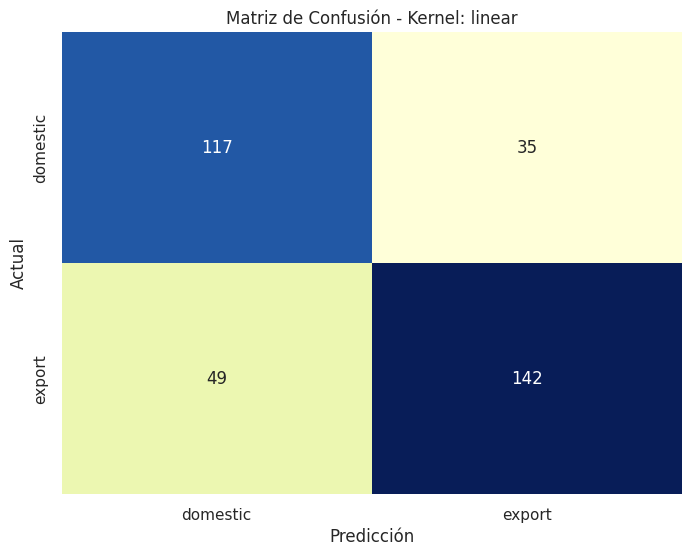


Informe de clasificación:
              precision    recall  f1-score   support

    domestic       0.70      0.77      0.74       152
      export       0.80      0.74      0.77       191

    accuracy                           0.76       343
   macro avg       0.75      0.76      0.75       343
weighted avg       0.76      0.76      0.76       343



In [ ]:
train_and_evaluate_svm('linear')



Evaluando SVM con kernel: poly


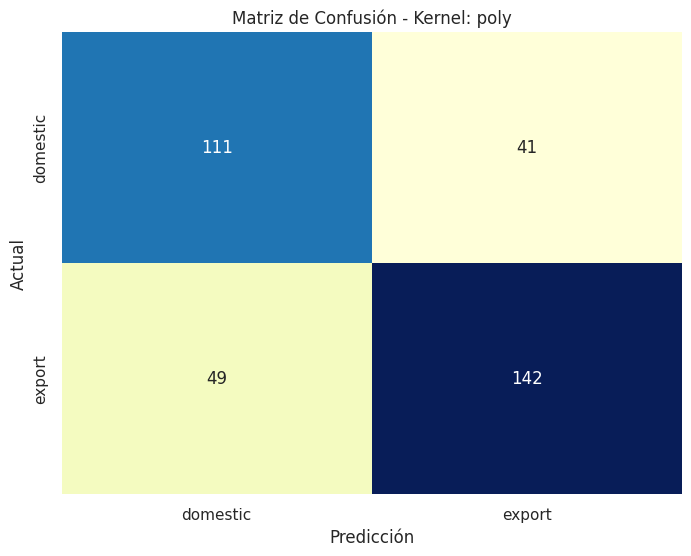


Informe de clasificación:
              precision    recall  f1-score   support

    domestic       0.69      0.73      0.71       152
      export       0.78      0.74      0.76       191

    accuracy                           0.74       343
   macro avg       0.73      0.74      0.74       343
weighted avg       0.74      0.74      0.74       343



In [ ]:
train_and_evaluate_svm('poly')



Evaluando SVM con kernel: rbf


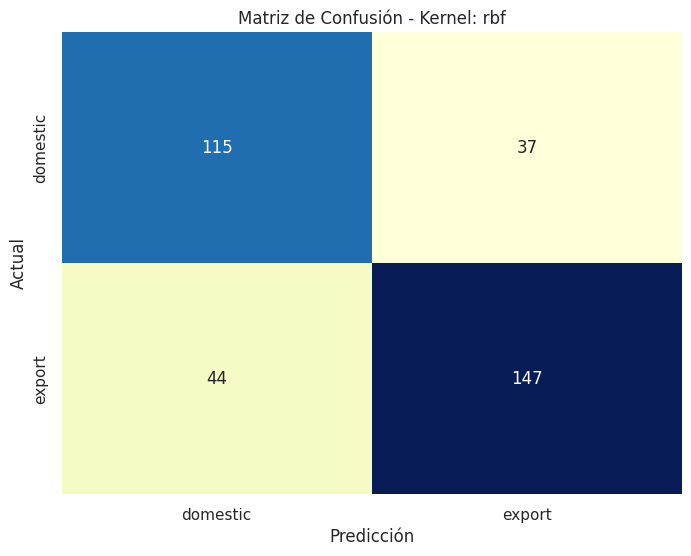


Informe de clasificación:
              precision    recall  f1-score   support

    domestic       0.72      0.76      0.74       152
      export       0.80      0.77      0.78       191

    accuracy                           0.76       343
   macro avg       0.76      0.76      0.76       343
weighted avg       0.77      0.76      0.76       343



In [ ]:
train_and_evaluate_svm('rbf')



Evaluando SVM con kernel: sigmoid


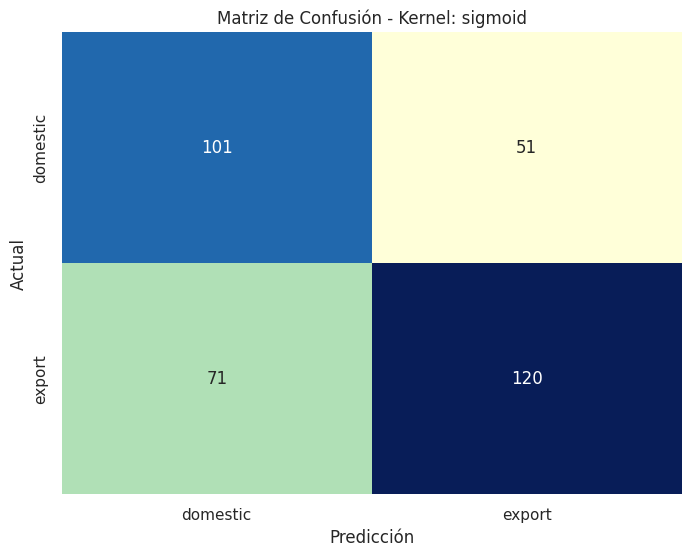


Informe de clasificación:
              precision    recall  f1-score   support

    domestic       0.59      0.66      0.62       152
      export       0.70      0.63      0.66       191

    accuracy                           0.64       343
   macro avg       0.64      0.65      0.64       343
weighted avg       0.65      0.64      0.65       343



In [ ]:
train_and_evaluate_svm('sigmoid')


Tras evaluar los resultados del modelo SVM con diferentes tipos de kernels, se concluyó que el kernel **RBF** (Radial Basis Function) fue el que mejor se adaptó a la distribución de nuestros datos. Este kernel obtuvo los mejores resultados en términos de precisión, mostrando su capacidad para manejar relaciones no lineales complejas entre las características.


### Neuronal Network

Las redes neuronales artificiales (ANN, por sus siglas en inglés) son sistemas diseñados para emular el comportamiento de las neuronas biológicas. Estas redes consisten en un conjunto de unidades de procesamiento interconectadas de manera específica para resolver problemas y generar resultados precisos. En el contexto de nuestro experimento, donde clasificamos vinos según su calidad, las ANN facilitan el análisis y la interpretación de agrupaciones de datos complejas, capturando patrones que serían difíciles de identificar mediante métodos tradicionales.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.utils import plot_model
from IPython.display import Image

In [ ]:
X = df.drop(['export_quality'], axis=1)

y = df['export_quality']


In [ ]:

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:
y_train = y_train.astype(int)
y_test = y_test.astype(int)


## Análisis de la Estructura del Modelo

Para desarrollar el modelo, se analizó la estructura requerida para nuestra red neuronal, considerando las principales arquitecturas disponibles:

1. **Sequential**:  
   - Ideal para modelos simples donde las capas están organizadas de forma lineal, con cada capa conectada directamente a la siguiente.

2. **Functional API**:  
   - Diseñada para arquitecturas más complejas, permite bifurcaciones, múltiples entradas/salidas y conexiones no lineales, lo que la hace adecuada para modelos con estructuras más avanzadas.

3. **Subclassing**:  
   - Ofrece la máxima flexibilidad, siendo adecuada para personalizaciones avanzadas o comportamientos específicos que no se ajustan a las arquitecturas anteriores.

4. **Recurrentes o Transformers**:  
   - Especialmente útiles para procesar datos secuenciales, como texto, series temporales o audio, gracias a su capacidad para manejar dependencias a largo plazo.

5. **Híbridos**:  Permiten combinar múltiples tipos de datos o estructuras en un mismo modelo, ideales para problemas que integran diversas fuentes de información.

### Elección de la Arquitectura

Con base en esta evaluación, se decidió utilizar la arquitectura **Sequential** debido a su simplicidad y practicidad. Esta opción se alinea bien con la naturaleza del proyecto, ya que aborda un problema relativamente simple y permite una implementación eficiente y efectiva.


## Funciones de Activación

Para definir las funciones de activación en las capas de nuestra red neuronal, evaluamos diversas opciones:

1. **Sigmoide**: Convierte los valores en probabilidades (0 a 1). Ideal para clasificación binaria, pero sufre de *vanishing gradient*.
2. **Tangente Hiperbólica (Tanh)**: Similar a la sigmoide, pero centrada en 0 (-1 a 1), mejora la convergencia, aunque también enfrenta gradientes pequeños.
3. **ReLU**: Mantiene valores positivos y convierte negativos en 0. Es eficiente y muy utilizada, aunque puede generar "neuronas muertas".
4. **Leaky ReLU**: Variante de ReLU que permite valores negativos pequeños (\(\alpha\)), resolviendo el problema de "neuronas muertas".
5. **PReLU**: Similar a Leaky ReLU, pero con \(\alpha\) aprendido durante el entrenamiento, ofreciendo mayor adaptabilidad.
6. **ELU**: Suaviza valores negativos, mejorando la convergencia y reduciendo el sesgo hacia valores positivos.
7. **Softmax**: Transforma las salidas en distribuciones de probabilidad (suma = 1). Ideal para clasificación multiclase.
8. **Swish**: Introducida por Google, combina suavidad y eficacia, destacando en redes profundas.
9. **GELU**: Suaviza transiciones no lineales, combinando ventajas de ReLU y sigmoide, común en modelos como Transformers.

### Elección de la Función de Activación

Basándonos en la naturaleza del problema, decidimos usar **ReLU** en las dos primeras capas. Su no linealidad permite capturar relaciones complejas y su capacidad para mantener valores positivos ayuda a resaltar características clave sin sesgos hacia rangos específicos, mejorando el rendimiento del modelo.

Para la **última capa**, utilizamos **sigmoide**, ya que nos permite realizar una clasificación binaria (doméstico vs. exportación), transformando la salida en una probabilidad de 0 o 1.


La configuración de las unidades fue 64→32→1, ya que equilibra capacidad y eficiencia. La primera capa asegura un procesamiento suficiente de las características, la segunda condensa la información para facilitar su interpretación, y la última capa traduce esa información en una probabilidad, ajustándose perfectamente a los requisitos del problema de clasificación binaria. Esta estructura sigue un estándar comúnmente utilizado en redes neuronales, donde se emplea una reducción gradual del número de unidades para optimizar el aprendizaje y evitar redundancias.

In [ ]:

model = Sequential()

model.add(Dense(units=64, activation='relu', input_shape=(X_train.shape[1],)))

model.add(Dense(units=32, activation='relu'))

model.add(Dense(units=1, activation='sigmoid'))


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)


Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.6092 - loss: 0.6766 - val_accuracy: 0.7563 - val_loss: 0.5576
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7236 - loss: 0.5824 - val_accuracy: 0.7500 - val_loss: 0.5144
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7489 - loss: 0.5380 - val_accuracy: 0.7750 - val_loss: 0.4931
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7584 - loss: 0.5224 - val_accuracy: 0.7750 - val_loss: 0.4902
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7874 - loss: 0.4857 - val_accuracy: 0.7812 - val_loss: 0.4906
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7603 - loss: 0.4969 - val_accuracy: 0.7750 - val_loss: 0.4874
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7889 - loss: 0.4876 - val_accuracy: 0.7812 - val_loss: 0.4818
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7882 - loss: 0.4637 - val_accuracy: 0.7688 - val_loss

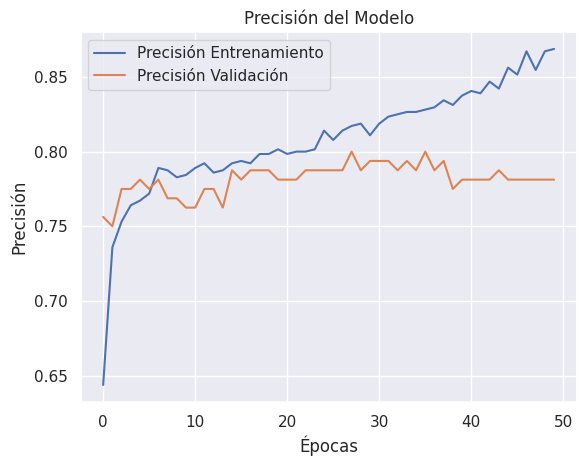

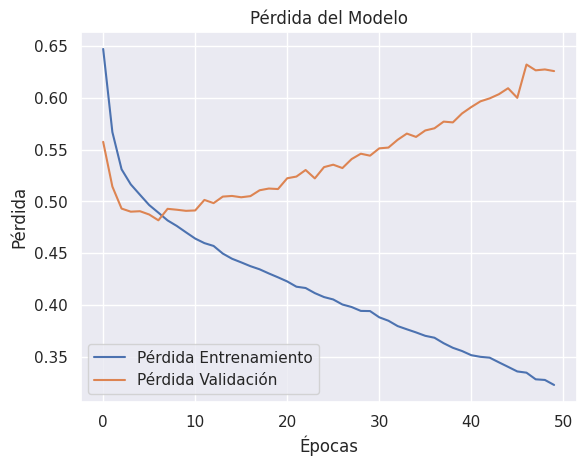

In [ ]:
plt.plot(history.history['accuracy'], label='Precisión Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión Validación')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()
plt.title('Precisión del Modelo')
plt.show()

plt.plot(history.history['loss'], label='Pérdida Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida Validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Pérdida del Modelo')
plt.show()


## Evaluación del Modelo

Durante el entrenamiento, se observaron las siguientes tendencias en las métricas de pérdida y precisión:

- **Pérdida de entrenamiento**: Disminuyó de manera constante, lo que indica que el modelo está aprendiendo correctamente del conjunto de entrenamiento.
  
- **Pérdida de validación**: Inicialmente, también disminuyó, pero después de 15-20 épocas, comenzó a aumentar, lo que sugiere que el modelo está experimentando **sobreajuste**.

- **Precisión de entrenamiento**: Mejoró de forma continua hasta el final del entrenamiento, lo que muestra que el modelo está mejorando en el ajuste de los datos de entrenamiento.

- **Precisión de validación**: Se estabilizó alrededor del 80% después de 15-20 épocas, lo que sugiere que el modelo dejó de mejorar en el conjunto de validación.

### Conclusión

Estos resultados indican que, aunque el modelo aprende bien del conjunto de entrenamiento, comienza a **aprender ruido** en lugar de generalizar después de cierto punto. Esto es un claro indicio de **sobreajuste**.

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Precisión en el conjunto de prueba: {accuracy:.2f}')


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7560 - loss: 0.6554  
Precisión en el conjunto de prueba: 0.74


Este resultado en la precisión sugiere que el modelo tiene un buen desempeño inicial, aunque puede haber margen para optimización si se busca una precisión más alta

In [ ]:
pip install pydot graphviz


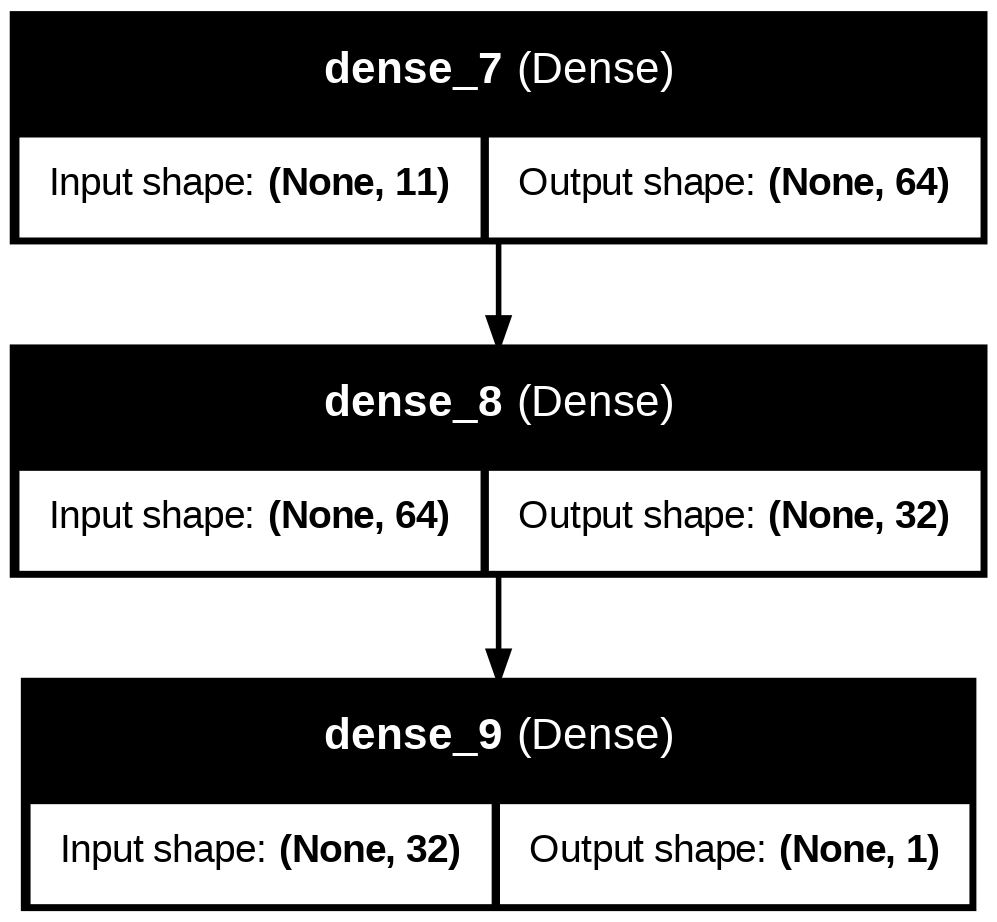

In [ ]:

plot_model(model, to_file="model_architecture.png", show_shapes=True, show_layer_names=True)
display(Image(filename="model_architecture.png"))

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


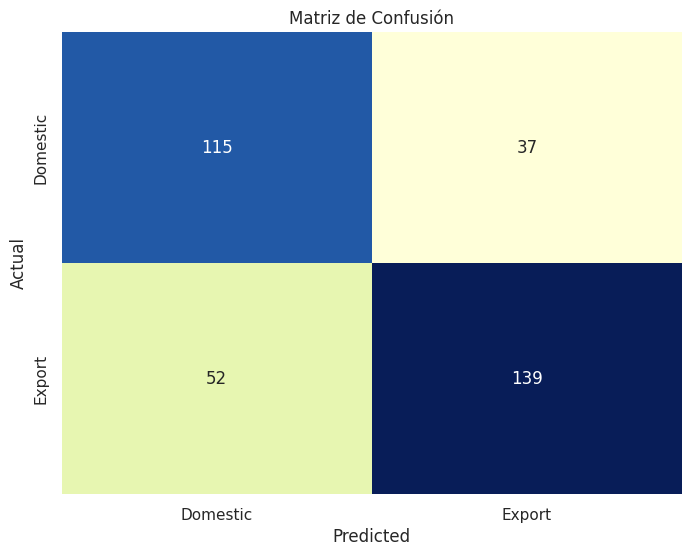

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.69      0.76      0.72       152
           1       0.79      0.73      0.76       191

    accuracy                           0.74       343
   macro avg       0.74      0.74      0.74       343
weighted avg       0.74      0.74      0.74       343



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report


y_pred = (model.predict(X_test) > 0.5).astype("int32")

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Domestic', 'Export'], columns=['Domestic', 'Export'])
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
            xticklabels=cm_df.columns, yticklabels=cm_df.index)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusión')
plt.show()
print('Reporte de Clasificación:')
print(classification_report(y_test, y_pred))


A continuación, se diseñó una nueva red neuronal con más capas y configuraciones ajustadas para explorar su desempeño y comprender

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.6506 - loss: 0.6112 - val_accuracy: 0.7750 - val_loss: 0.4825
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7777 - loss: 0.4813 - val_accuracy: 0.7375 - val_loss: 0.5227
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7877 - loss: 0.4745 - val_accuracy: 0.7688 - val_loss: 0.4881
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7614 - loss: 0.4764 - val_accuracy: 0.7750 - val_loss: 0.4780
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7935 - loss: 0.4488 - val_accuracy: 0.7688 - val_loss: 0.4849
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8052 - loss: 0.4292 - val_accuracy: 0.7875 - val_loss: 0.4912
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7742 - loss: 0.4681 - val_accuracy: 0.7750 - val_loss: 0.5029
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8232 - loss: 0.4149 - val_accuracy: 0.7750 - val_loss: 

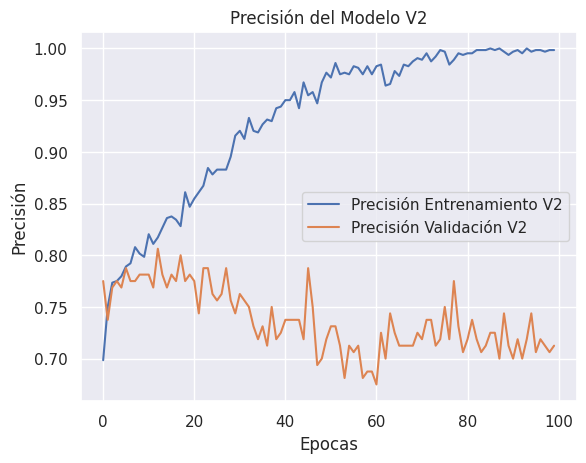

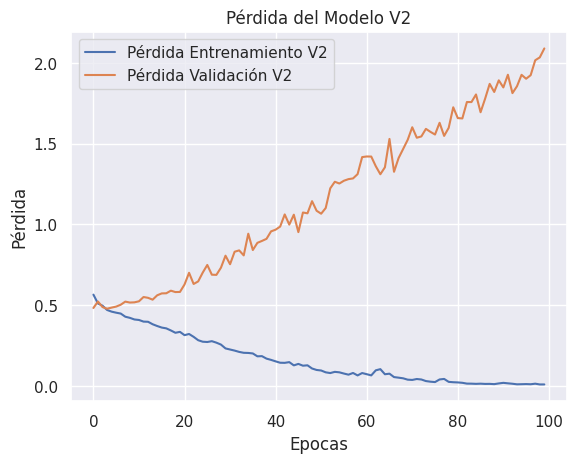

In [ ]:

model_v2 = Sequential()

model_v2.add(Dense(units=128, activation='relu', input_shape=(X_train.shape[1],)))

model_v2.add(Dense(units=64, activation='tanh'))

model_v2.add(Dense(units=32, activation='relu'))

model_v2.add(Dense(units=1, activation='sigmoid'))



optimizer = Adam(learning_rate=0.001)
model_v2.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])


history_v2 = model_v2.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.2)

loss_v2, accuracy_v2 = model_v2.evaluate(X_test, y_test)
print(f'Precisión del modelo V2 en el conjunto de prueba: {accuracy_v2:.2f}')


plt.plot(history_v2.history['accuracy'], label='Precisión Entrenamiento V2')
plt.plot(history_v2.history['val_accuracy'], label='Precisión Validación V2')
plt.xlabel('Epocas')
plt.ylabel('Precisión')
plt.legend()
plt.title('Precisión del Modelo V2')
plt.show()

plt.plot(history_v2.history['loss'], label='Pérdida Entrenamiento V2')
plt.plot(history_v2.history['val_loss'], label='Pérdida Validación V2')
plt.xlabel('Epocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Pérdida del Modelo V2')
plt.show()


Hacer la red más compleja y entrenarla por más tiempo no fue beneficioso. El modelo sufrió de sobreajuste, aprendiendo patrones específicos del entrenamiento que no generalizan bien al conjunto de validación. Es crucial limitar las épocas, simplificar la arquitectura y usar regularización para mejorar el desempeño en validación.

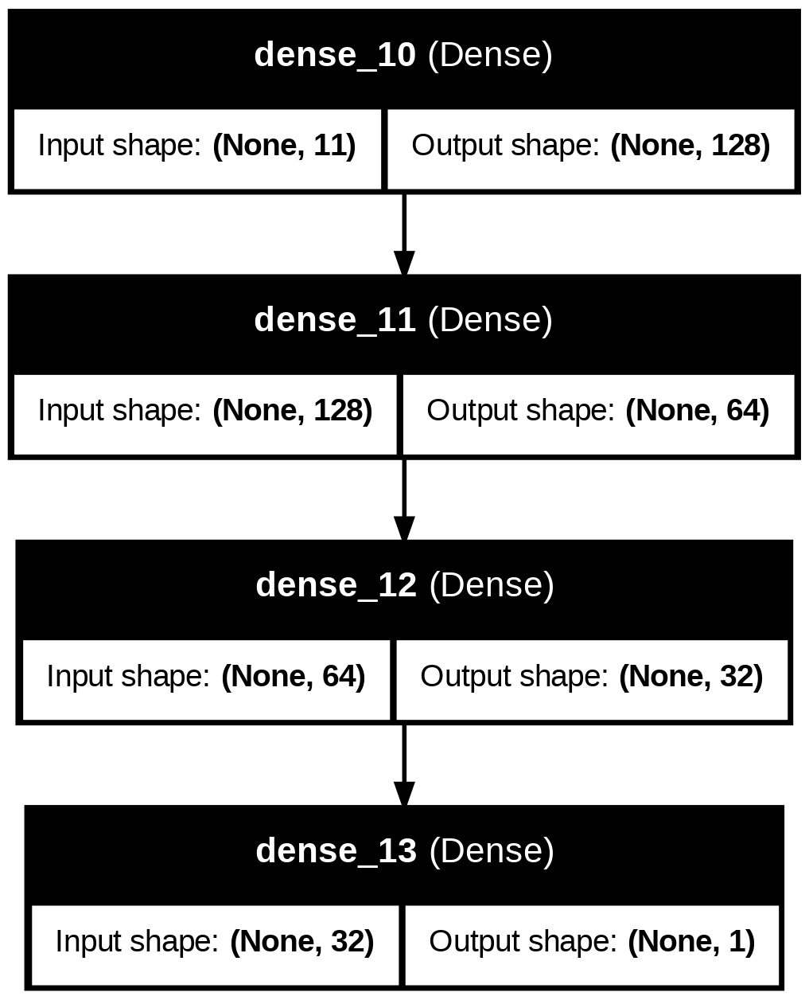

In [ ]:
plot_model(model_v2, to_file="model_v2_architecture.png", show_shapes=True, show_layer_names=True)

display(Image(filename="model_v2_architecture.png"))


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


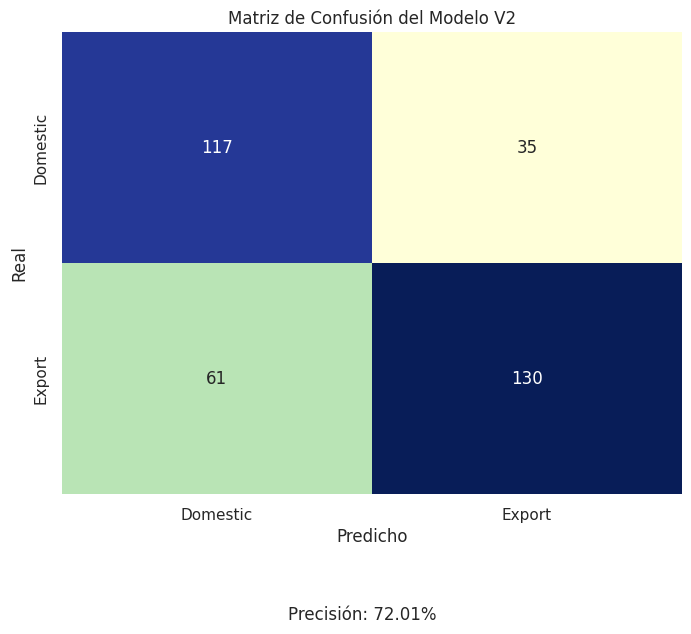

In [ ]:

y_pred_v2 = (model_v2.predict(X_test) > 0.5).astype("int32")
from sklearn.metrics import confusion_matrix, classification_report

cm_v2 = confusion_matrix(y_test, y_pred_v2)
cm_df_v2 = pd.DataFrame(cm_v2, index=['Domestic', 'Export'], columns=['Domestic', 'Export'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df_v2, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
            xticklabels=cm_df_v2.columns, yticklabels=cm_df_v2.index)
plt.xlabel('Predicho')
plt.ylabel('Real')
plt.title('Matriz de Confusión del Modelo V2')

report = classification_report(y_test, y_pred_v2, output_dict=True)
accuracy = report['accuracy']
plt.figtext(0.5, -0.1, f'Precisión: {accuracy:.2%}', wrap=True, horizontalalignment='center', fontsize=12)
plt.show()


##Bonus: árboles de Decisión – ID3

El algoritmo ID3 (Iterative Dichotomiser 3) es un método de aprendizaje supervisado utilizado para construir árboles de decisión.Su objetivo es crear un árbol que represente claramente las reglas de decisión para clasificar datos. El algoritmo ID3 se adapta a nuestro problema porque utiliza las características del vino (como acidez, pH, alcohol, etc.) para construir reglas claras y jerárquicas en forma de árbol de decisión.



Para construir el árbol de decisión, se investigaron los siguientes criterios de calidad de las divisiones:

**Entropy (Entropía)**:

Mide la pureza del nodo utilizando la teoría de la información.
Es útil para generar árboles más interpretativos y equilibrados, ya que selecciona divisiones que maximizan la reducción de incertidumbre (ganancia de información), usado para problemas donde la interpretabilidad y el análisis profundo de las características son prioritarios.

**Gini Index:**

Calcula la probabilidad de clasificar incorrectamente una muestra si se elige al azar según la distribución del nodo.
Es más rápido de calcular y eficiente en términos computacionales, aunque las divisiones tienden a ser similares a las de entropía en muchos casos.Usado en tareas donde la velocidad es crucial y la interpretabilidad no es tan prioritaria.

**Log Loss:**

Optimiza la probabilidad logarítmica de las predicciones, siendo útil en problemas probabilísticos.Ademas de ser menos común, está diseñado para contextos más específicos, como conjuntos de datos con múltiples clases y distribuciones complejas.


Se eligió entropy porque se ajusta mejor a nuestro problema al proporcionar divisiones más precisas y explícitas en comparación con otros criterios

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [ ]:
model_id3 = DecisionTreeClassifier(criterion='entropy', random_state=42)

In [ ]:
model_id3.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [ ]:
accuracy_id3 = model_id3.score(X_test, y_test)
print(f'Precisión del modelo ID3 en el conjunto de prueba: {accuracy_id3:.2f}')


Precisión del modelo ID3 en el conjunto de prueba: 0.72


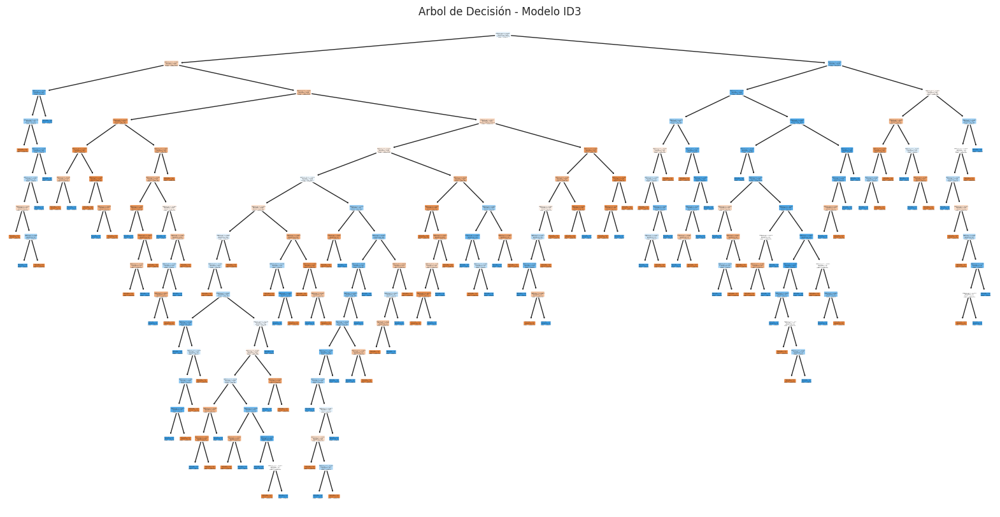

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plot_tree(model_id3, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], class_names=['Domestic', 'Export'], filled=True, rounded=True)
plt.title('Arbol de Decisión - Modelo ID3')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(60, 20), dpi=300)
plot_tree(model_id3, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], class_names=['Domestic', 'Export'], filled=True, rounded=True, fontsize=10)
plt.title('Arbol de Decisión - Modelo ID3', fontsize=16)
plt.savefig('arbol_decision_modelo_id3.png', bbox_inches='tight')
plt.show()

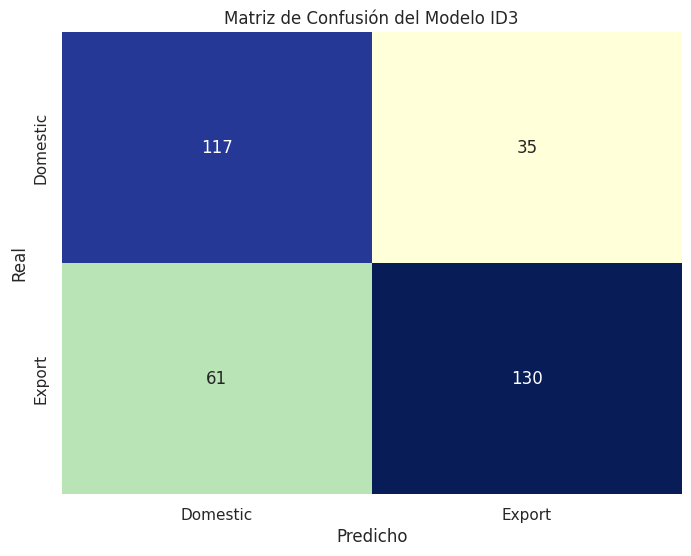

Reporte de Clasificación del Modelo ID3:
              precision    recall  f1-score   support

           0       0.66      0.77      0.71       152
           1       0.79      0.68      0.73       191

    accuracy                           0.72       343
   macro avg       0.72      0.73      0.72       343
weighted avg       0.73      0.72      0.72       343



In [ ]:
y_pred_id3 = model_id3.predict(X_test)
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import pandas as pd

cm_id3 = confusion_matrix(y_test, y_pred_id3)
cm_df_id3 = pd.DataFrame(cm_id3, index=['Domestic', 'Export'], columns=['Domestic', 'Export'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df_id3, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
            xticklabels=cm_df_id3.columns, yticklabels=cm_df_id3.index)
plt.xlabel('Predicho')
plt.ylabel('Real')
plt.title('Matriz de Confusión del Modelo ID3')
plt.show()

print('Reporte de Clasificación del Modelo ID3:')
print(classification_report(y_test, y_pred_id3))

Para analizar mejor los resultados, se decidió realizar un segundo intento utilizando el criterio Gini, explorando cómo afecta al rendimiento y la calidad de las divisiones del modelo

In [ ]:
model_id3_v2 = DecisionTreeClassifier(criterion='gini', random_state=42)

In [ ]:
model_id3_v2.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [ ]:
accuracy_id3_v2 = model_id3_v2.score(X_test, y_test)
print(f'Precisión del modelo ID3 en el conjunto de prueba: {accuracy_id3:.2f}')

Precisión del modelo ID3 en el conjunto de prueba: 0.72


In [ ]:
plt.figure(figsize=(60, 20), dpi=300)  # Expandir la imagen para que sea más ancha
plot_tree(model_id3_v2, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], class_names=['Domestic', 'Export'], filled=True, rounded=True, fontsize=10)
plt.title('Arbol de Decisión - Modelo ID3', fontsize=16)
plt.savefig('arbol_decision_modelo_id3_v2.png', bbox_inches='tight')  # Guardar la visualización como archivo de imagen con alta calidad
plt.show()

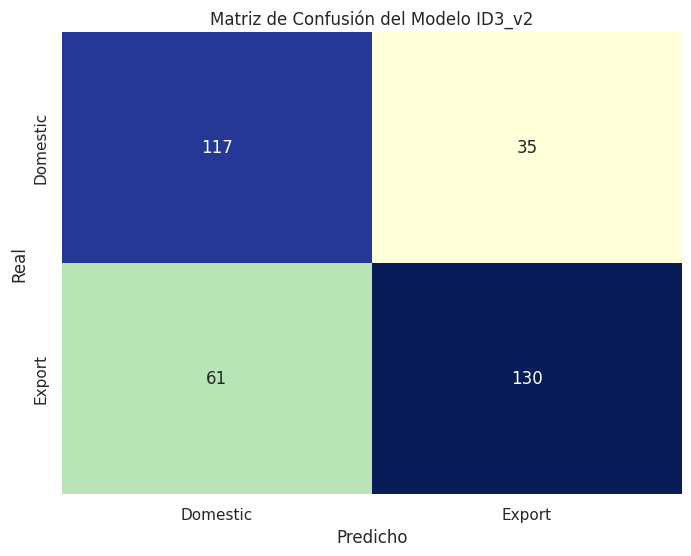

Reporte de Clasificación del Modelo ID3_v2:
              precision    recall  f1-score   support

           0       0.64      0.68      0.66       152
           1       0.73      0.69      0.71       191

    accuracy                           0.69       343
   macro avg       0.68      0.68      0.68       343
weighted avg       0.69      0.69      0.69       343



In [ ]:
y_pred_id3_v2 = model_id3_v2.predict(X_test)
cm_id3_v2 = confusion_matrix(y_test,y_pred_id3_v2)
cm_df_id3_v2 = pd.DataFrame(cm_id3_v2, index=['Domestic', 'Export'], columns=['Domestic', 'Export'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df_id3, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
            xticklabels=cm_df_id3_v2.columns, yticklabels=cm_df_id3_v2.index)
plt.xlabel('Predicho')
plt.ylabel('Real')
plt.title('Matriz de Confusión del Modelo ID3_v2')
plt.show()

print('Reporte de Clasificación del Modelo ID3_v2:')
print(classification_report(y_test, y_pred_id3_v2))

El cambio de criterio no tuvo un impacto perceptible en el desempeño del modelo. Esto sugiere que, en este caso, tanto entropía como Gini producen divisiones con resultados similares para la clasificación de vinos.

## Evaluación de Modelos

### **SVM con Kernel RBF**
El modelo **SVM con kernel RBF** demostró ser el más efectivo para este conjunto de datos, capturando relaciones no lineales complejas de manera eficiente. Su capacidad para manejar relaciones no lineales y su precisión superior lo hacen ideal para este tipo de problema.

### **Redes Neuronales**
Las **redes neuronales** proporcionaron una buena precisión, pero requieren una cuidadosa configuración y regularización para evitar el sobreajuste. La elección de la arquitectura y las funciones de activación adecuadas es crucial para obtener un buen rendimiento.

### **Árboles de Decisión (ID3)**
Los **árboles de decisión (ID3)** fueron útiles para interpretar las reglas de decisión, aunque su precisión fue ligeramente inferior a la de SVM y redes neuronales. A pesar de esto, proporcionan una estructura clara y jerárquica de decisiones, lo que resulta útil para la interpretación del modelo.
